# MobileNet-v1-224px - Data Augmentation

## Activa GPU rey, desde notebooks settings

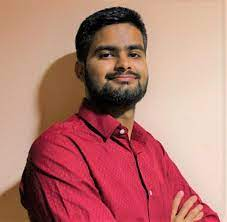

## Librerias

Instalar roboflow e importar el resto de las librerias.

Tip: luego de correr pip install roboflow, apretar en la cruz que sale para ocultar el output horrible.

In [ ]:
!pip install roboflow

In [ ]:
import numpy as np
import cv2
from keras.applications.mobilenet import MobileNet
from keras.models import Model, Sequential
from keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout
from keras.optimizers import Adam
from keras import layers
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import plot_model
import pandas as pd
from roboflow import Roboflow
from keras import callbacks
from google.colab.patches import cv2_imshow

## RoboFlow

Importar datos utilizando la API de roboflow: esto viene del export que sale de RoboFlow, seleccionando metodo de export "code" y "multiclass"

In [ ]:
rf = Roboflow(api_key="RIRyho5TtyNxqxJqhn2s")
project = rf.workspace("fall-detection-nzoyh").project("fall-detection-bb")
dataset = project.version(5).download("multiclass")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to fall-detection-bb-5 in multiclass:: 100%|██████████| 3180/3180 [00:01<00:00, 1808.62it/s]


Guardamos la version

In [ ]:
version = int(dataset.version)
version

5

Funcion **move to folder**:

Generar las carpetas fall y no fall y meter las imagenes donde correspondan segun lo que dicen los CSV

In [ ]:
import os
import shutil
import pandas as pd

def move_to_folders(version, folder):
  # Define the paths
  image_folder = f"/content/fall-detection-bb-{version}/{folder}"
  csv_file = f"/content/fall-detection-bb-{version}/{folder}/_classes.csv"
  output_folder = f"/content/fall-detection-bb-{version}/{folder}"

  # Read the CSV file
  data = pd.read_csv(csv_file)
  data['label'] = ['fall' if x == 1 else 'no fall' for x in data[' fall']]

  # Create folders for each label
  for label in ["fall", "no fall"]:
      folder_path = os.path.join(output_folder, label)
      os.makedirs(folder_path, exist_ok=True)

  # Move images to their corresponding folders
  for index, row in data.iterrows():
      image_name = row["filename"]
      label = row["label"]

      source_path = os.path.join(image_folder, image_name)
      destination_folder = os.path.join(output_folder, label)
      destination_path = os.path.join(destination_folder, image_name)

      # Move the image to the destination folder
      shutil.move(source_path, destination_path)

  print("Images moved successfully!")

Luego de correr esto, comprobar que en cada carpeta de train, test y valid ahora hay dos carpetas dentro, fall y no fall.

In [ ]:
move_to_folders(version,'train')
move_to_folders(version,'valid')
move_to_folders(version,'test')

Images moved successfully!
Images moved successfully!
Images moved successfully!


## Data Prep for Model

No hace falta tocar nada.

Lo que hace este paso es generar el formato dataset que luego tomara el modelo para entrenar y predecir.

In [ ]:
# Rutas de las carpetas de entrenamiento, validación y prueba
train_dir = f'/content/fall-detection-bb-{version}/train'
valid_dir = f'/content/fall-detection-bb-{version}/valid'
test_dir = f'/content/fall-detection-bb-{version}/test'

# Tamaño de redimensionamiento deseado
target_size = (224, 224)

# Definir la transformación de datos para el conjunto de entrenamiento
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalizar los valores de píxeles a [0, 1]
    # preprocessing_function=lambda x: cv2.resize(x, target_size)
)

# Definir la transformación de datos para el conjunto de validación y prueba
valid_datagen = ImageDataGenerator(
    rescale=1./255,
    # preprocessing_function=lambda x: cv2.resize(x, target_size)
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
    # preprocessing_function=lambda x: cv2.resize(x, target_size)
)

# Crear generadores de datos a partir de las carpetas
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,  # Tamaño de las imágenes de entrada
    batch_size=32,  # Tamaño del lote (batch)
    class_mode='binary', # Modo de clasificación (categórica en este caso)
    classes = ['no fall','fall'],
    shuffle=False
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    classes = ['no fall','fall'],
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=target_size,
    batch_size=32,
    class_mode='binary',
    classes = ['no fall','fall'],
    shuffle=False
)

Found 2808 images belonging to 2 classes.
Found 198 images belonging to 2 classes.
Found 166 images belonging to 2 classes.


In [ ]:
test_generator.class_indices

{'no fall': 0, 'fall': 1}

## Define model

En este ejemplo cargamos el modelo MobileNet, con los pesos del dataset imagenet.

In [ ]:
def load_MobileNet():
  base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

  for layer in base_model.layers:
    layer.trainable = False

  return base_model

base_model = load_MobileNet()

17225924/17225924 [==============================] - 1s 0us/step


Numero de clases: no tocar, estmaos haciendo binario

Capas densas, se puede tocar si se quiere

In [ ]:
num_classes = 2

model = Sequential()
model.add(base_model)

model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(32,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

Compilar.

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.001),
                     loss='binary_crossentropy',
                     metrics=[tf.keras.metrics.AUC()])

Visualizar

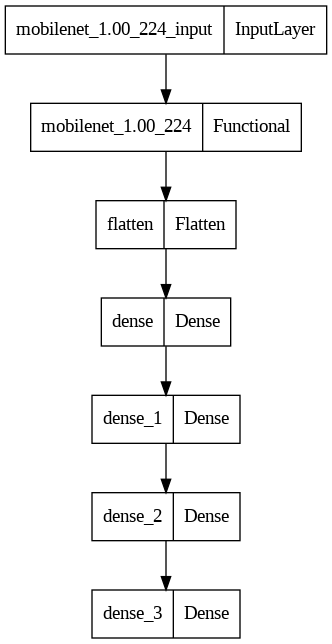

In [ ]:
plot_model(model)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 flatten (Flatten)           (None, 50176)             0         
                                                                 
 dense (Dense)               (None, 128)               6422656   
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                        

Preparamos todo para poder guardar el mejor modelo en drive. Darle OK cuando te salte la ventana emergente.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
if not os.path.isdir('/content/gdrive/MyDrive/bestmodels'):
  print('creando best model para vos bebe')
  os.makedirs('/content/gdrive/MyDrive/bestmodels')
else:
  print('ya existe la carpeta, good')

ya existe la carpeta, good


Preparar callbacks de early stopping y de best model.

!!! Cambiar el nombre del modelo a algo propio

In [ ]:
es_callback = callbacks.EarlyStopping(
    monitor='val_auc',
    patience=10,
    verbose=1)

model_input = input()
model_name = f'{model_input}.h5' # MODIFICAR CON LO PROPIO

mc_callback = callbacks.ModelCheckpoint(
    filepath=f'/content/gdrive/MyDrive/bestmodels/{model_name}',
    monitor='val_auc',
    mode='max',
    save_best_only=True)

mobilenet_v5_aug


Ejecutar

In [ ]:
history = model.fit(train_generator, epochs=100,
                    validation_data=valid_generator,
                    callbacks = [es_callback,mc_callback])

Epoch 1/100
88/88 [==============================] - 21s 116ms/step - loss: 2.5637 - auc: 0.6908 - val_loss: 1.9437 - val_auc: 0.6301
Epoch 2/100
88/88 [==============================] - 9s 97ms/step - loss: 0.9142 - auc: 0.8480 - val_loss: 0.8828 - val_auc: 0.8925
Epoch 3/100
88/88 [==============================] - 9s 104ms/step - loss: 0.4658 - auc: 0.9337 - val_loss: 0.4233 - val_auc: 0.9094
Epoch 4/100
88/88 [==============================] - 9s 107ms/step - loss: 0.3064 - auc: 0.9609 - val_loss: 0.4421 - val_auc: 0.9059
Epoch 5/100
88/88 [==============================] - 8s 86ms/step - loss: 0.8550 - auc: 0.8858 - val_loss: 0.4562 - val_auc: 0.8627
Epoch 6/100
88/88 [==============================] - 10s 118ms/step - loss: 0.4528 - auc: 0.9413 - val_loss: 0.6423 - val_auc: 0.9325
Epoch 7/100
88/88 [==============================] - 8s 91ms/step - loss: 0.3675 - auc: 0.9555 - val_loss: 2.1056 - val_auc: 0.8593
Epoch 8/100
88/88 [==============================] - 8s 92ms/step - lo

## Resultados

Cargar best model

In [ ]:
best_model = tf.keras.models.load_model(f'/content/gdrive/MyDrive/bestmodels/{model_name}')

Ploteamos

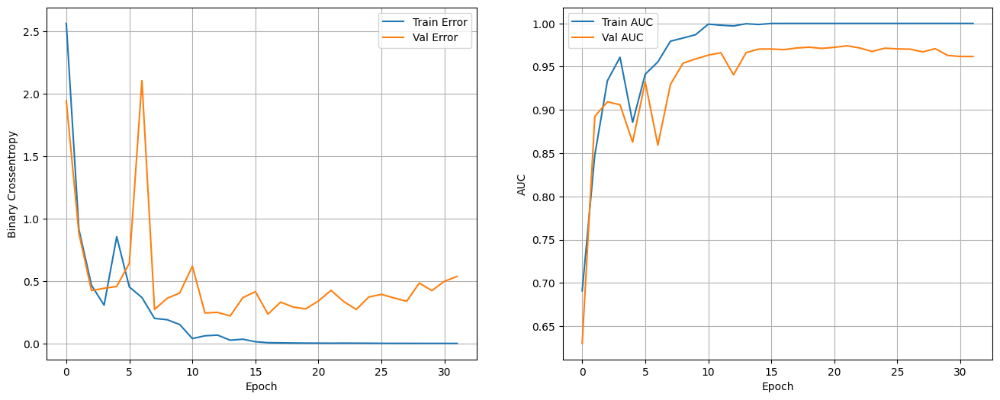

In [ ]:
def show_loss_auc_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Binary Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label = 'Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('AUC')
    ax2.plot(hist['epoch'], hist['auc'], label='Train AUC')
    ax2.plot(hist['epoch'], hist['val_auc'], label = 'Val AUC')
    ax2.grid()
    ax2.legend()

    plt.show()

show_loss_auc_evolution(history)

Insight de resultados

In [ ]:
true_labels = test_generator.labels
true_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [ ]:
predictions = best_model.predict(test_generator)
preds = np.round(predictions).flatten()

6/6 [==============================] - 1s 70ms/step


Accuracy y AUC de sklearn

!! Ver que da distinta a la de TF. Es porque tienen configurados disitntos thresholds.

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

print(f'Accuracy en test: {accuracy_score(true_labels,preds)}')
print(f'AUC en test: {roc_auc_score(true_labels,preds)}')

Accuracy en test: 0.9337349397590361
AUC en test: 0.9541666666666666


Classification report

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

print(classification_report(true_labels,preds))

              precision    recall  f1-score   support

           0       0.81      1.00      0.89        46
           1       1.00      0.91      0.95       120

    accuracy                           0.93       166
   macro avg       0.90      0.95      0.92       166
weighted avg       0.95      0.93      0.94       166



Matriz de confusion

In [ ]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.grid(False)

Confusion matrix, without normalization
[[ 46   0]
 [ 11 109]]


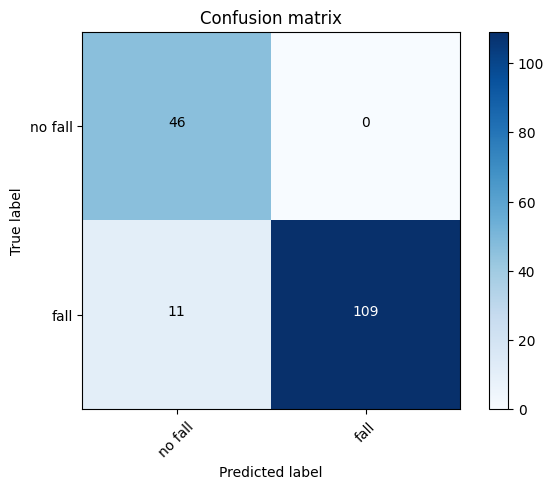

In [ ]:
class_names = list(test_generator.class_indices.keys())
plot_confusion_matrix(confusion_matrix(true_labels,preds),class_names)
plt.show()

## Ejemplos de errores

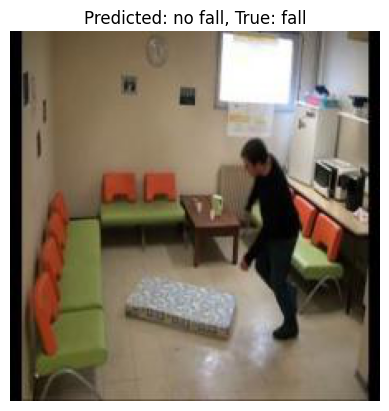

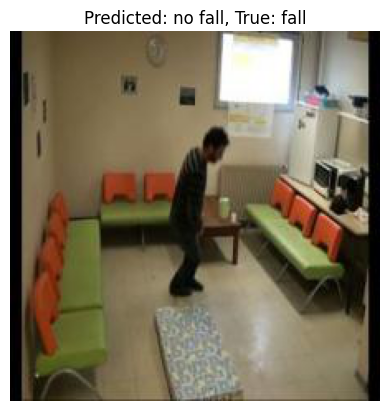

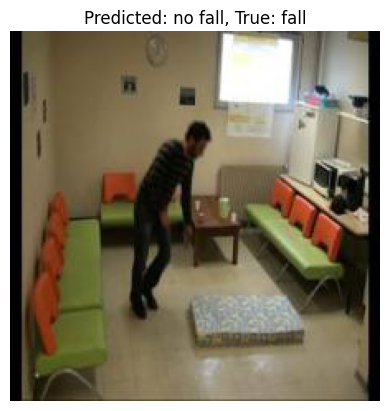

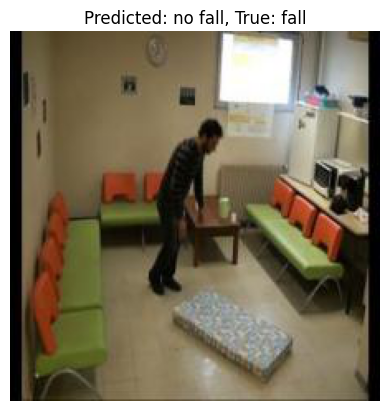

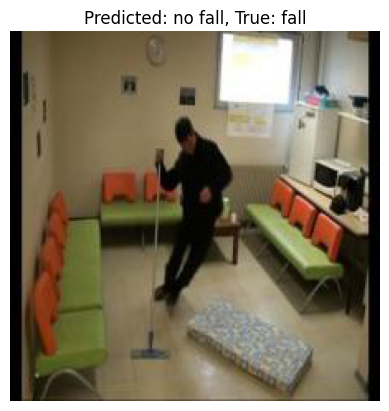

...

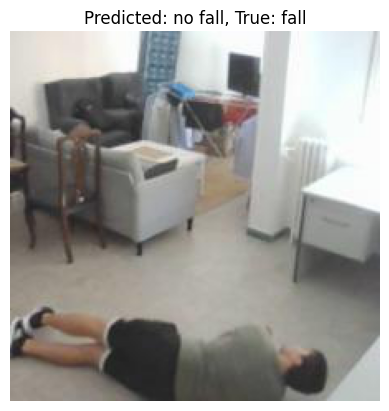

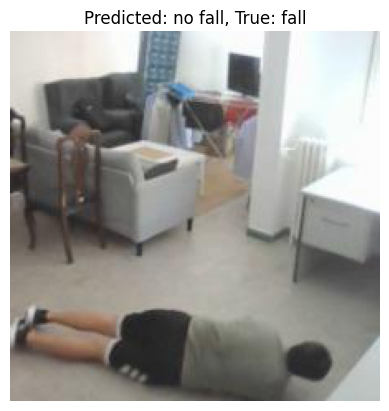

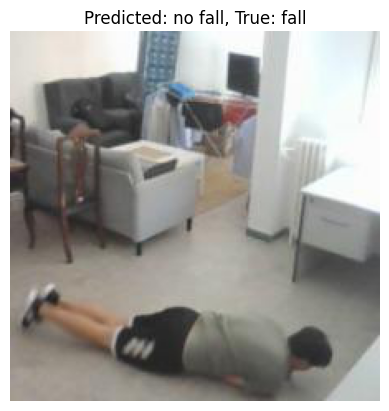

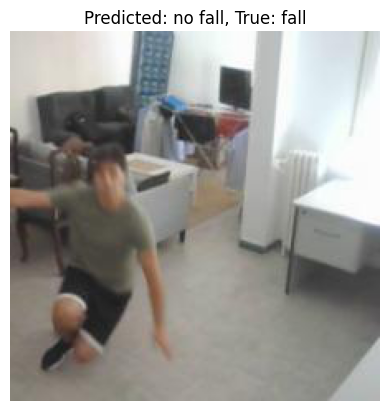

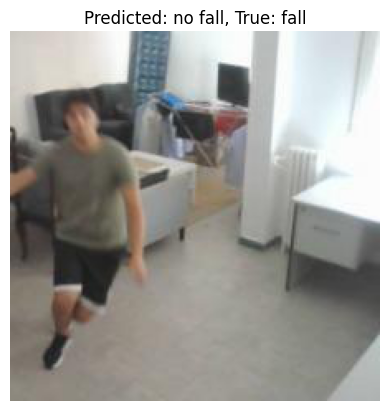

In [ ]:
# Recorre las imágenes de prueba y muestra cada una con su predicción y etiqueta real
for i in range(len(test_generator.filenames)):

    if class_names[int(preds[i])] != class_names[true_labels[i]]:

      image_path = test_dir + '/' + test_generator.filenames[i]
      image = plt.imread(image_path)

      plt.imshow(image)
      plt.title(f'Predicted: {class_names[int(preds[i])]}, True: {class_names[true_labels[i]]}')
      plt.axis('off')
      plt.show()

    else:
      pass

## Probando en nuevas imagenes

In [ ]:
def preprocessImage(image, target_size):
  resized_image = cv2.resize(image, target_size)
  normalized_image = resized_image.astype(np.float32) / 255.0
  return normalized_image

def predictNewImage(image, threshold=0.5):
  image_processed = preprocessImage(image, target_size=(224,224))
  prediction_example = best_model.predict(np.expand_dims(image_processed, axis=0))

  # Set a threshold for classifying as positive or negative
  threshold = 0.5

  # Convert the predicted probabilities to binary classes
  binary_preds = (prediction_example > threshold).astype(int)

  # Print the predicted class
  if binary_preds[0][0] == 1:
      print("The image is classified as Fall")
  else:
      print("The image is classified as No Fall")

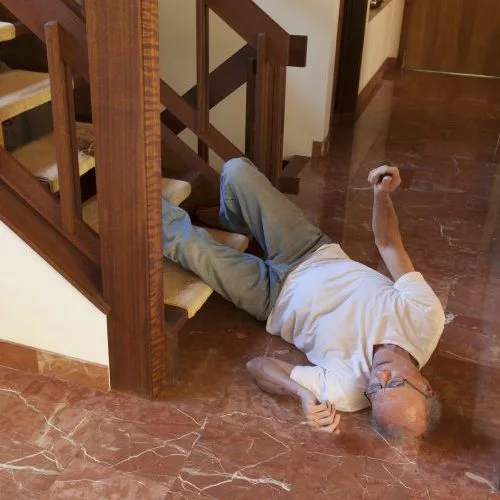

In [ ]:
img_path = '/content/example_2.jpg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 1s 788ms/step
The image is classified as No Fall


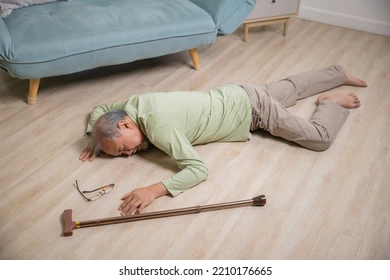

In [ ]:
img_path = '/content/example_3.jpg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 0s 24ms/step
The image is classified as No Fall


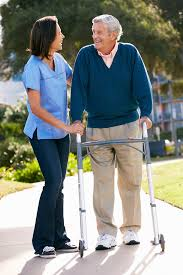

In [ ]:
img_path = '/content/example_no_fall.jpg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 0s 27ms/step
The image is classified as No Fall


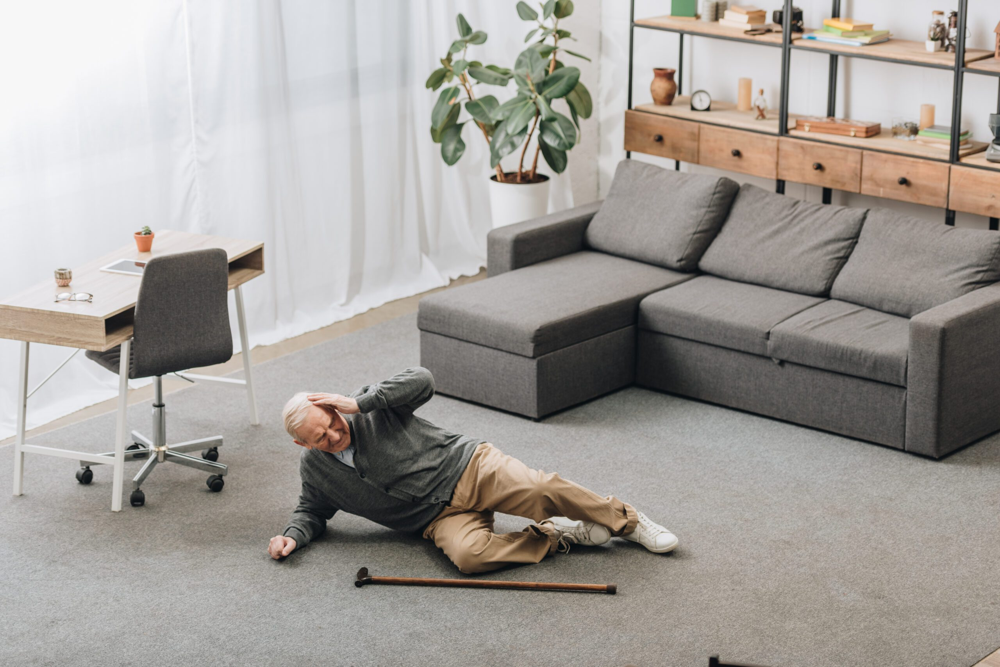

In [ ]:
img_path = '/content/example_fall.jpeg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 0s 28ms/step
The image is classified as No Fall


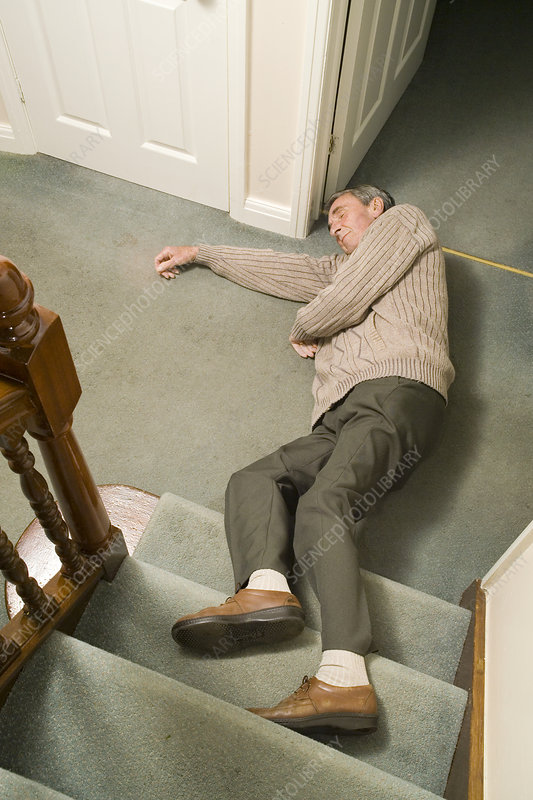

In [ ]:
img_path = '/content/example_1.jpg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 0s 27ms/step
The image is classified as No Fall


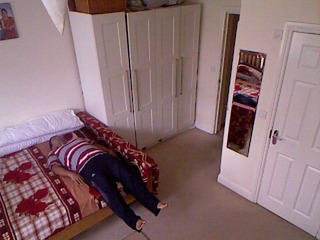

In [ ]:
img_path = '/content/sumit_1.jpg'
image = cv2.imread(img_path)
cv2_imshow(image)

In [ ]:
predictNewImage(image)

1/1 [==============================] - 0s 39ms/step
The image is classified as Fall


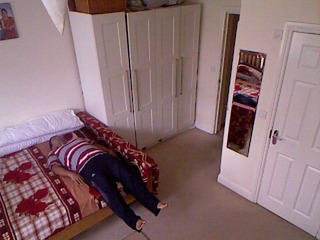

1/1 [==============================] - 0s 24ms/step
The image is classified as Fall


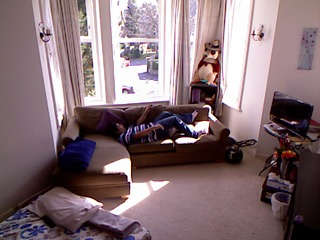

1/1 [==============================] - 0s 25ms/step
The image is classified as Fall


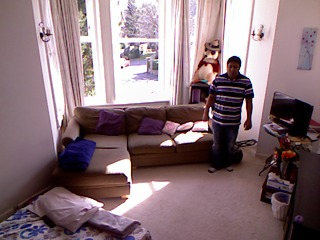

1/1 [==============================] - 0s 25ms/step
The image is classified as No Fall


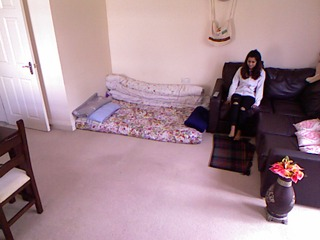

1/1 [==============================] - 0s 25ms/step
The image is classified as No Fall


In [ ]:
for i in range(1,5):

  img_path = f'/content/sumit_{i}.jpg'
  image = cv2.imread(img_path)
  cv2_imshow(image)
  predictNewImage(image)

## Grad Cam Adam

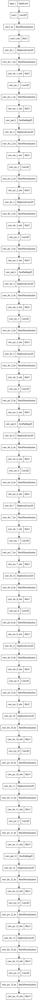

In [ ]:
plot_model(best_model.get_layer('mobilenet_1.00_224'))

In [ ]:
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize


In [ ]:
from tensorflow.keras.preprocessing import image
img_path = '/content/fall-detection-bb-5/test/fall/denis3_26_jpg.rf.8ebf9fd87995ba3542f19aadd8b560d0.jpg'
img = image.load_img(img_path,color_mode='rgb', target_size=(224, 224))
imageb = cv2.imread(img_path)
x = image.img_to_array(img)

In [ ]:
def gradcam(model, x, img_rows, img_cols, alpha=0.5, layer_name='conv_pw_13_relu'):
    '''
    Aplica técnica Gradient-weighted Class Activation Mapping (Grad-CAM) a
    una imagen, dado un modelo.
    Fuentes: https://fairyonice.github.io/Grad-CAM-with-keras-vis.html
    https://arxiv.org/abs/1610.02391

    Parametros:
      model (Sequential): modelo de Keras con al menos una capa convolucional.
      x (np.array): Array de numpy que representa la imagen a visualizar, con tamaño del model.input
      img_cols (int): cantidad de pixeles de ancho de la imagen
      img_cols (int): cantidad de pixeles de largo de la imagen
      alpha (float): transparencia del mapa de calor
      layer_name (string): capa de model a visualizar. Se recomienda que sea la última capa convolucional de model
    '''

    X = np.expand_dims(x, axis=0)

    # Realizar prediccion
    model.predict(X)

    last_conv=model.get_layer('mobilenet_1.00_224')#.get_layer(layer_name)
    grads = K.gradients(model.output,last_conv.get_output_at(-1))[0]

    # Calculate gradients
    pooled_grads = K.mean(grads,axis=(0,1,2))
    iterate = K.function([model.input],[pooled_grads,last_conv.get_output_at(-1)[0]])
    pooled_grads_value,conv_layer_output = iterate([X])

    # Ponderar gradientes con activación de la capa visualizar.
    if np.any(pooled_grads_value!=0):
      for i in range(last_conv.input_shape[-1]):
        conv_layer_output[:,:,i] *= pooled_grads_value[i]

    heatmap = np.mean(conv_layer_output,axis=-1)

    # Activación Relu de los gradientes
    for i in range(heatmap.shape[0]):
      for j in range(heatmap.shape[1]):
          heatmap[i,j] = np.max(heatmap[i,j],0)

    # Escalado para visualización del heatmap
    heatmap = np.maximum(heatmap,0)
    if np.max(heatmap != 0):
      heatmap /= np.max(heatmap)

    # Graficado
    upsample = resize(heatmap, (img_rows,img_cols),preserve_range=True)

    f = plt.figure(figsize=(10,10))
    f.add_subplot(1,2, 1)
    plt.imshow(x)
    plt.imshow(upsample,alpha=alpha,cmap = 'bwr')
    f.add_subplot(1,2, 2)
    plt.imshow(x)
    plt.show(block=True)

    # print('Probabilidad de clase 1: ', model.predict_proba(X)[0], '\n')
    return

In [ ]:
# tf.compat.v1.disable_eager_execution()
# best_model = tf.keras.models.load_model(f'/content/gdrive/MyDrive/bestmodels/{model_name}')

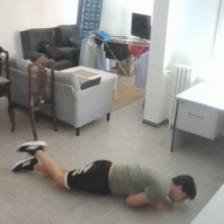

In [ ]:
cv2_imshow(imageb)

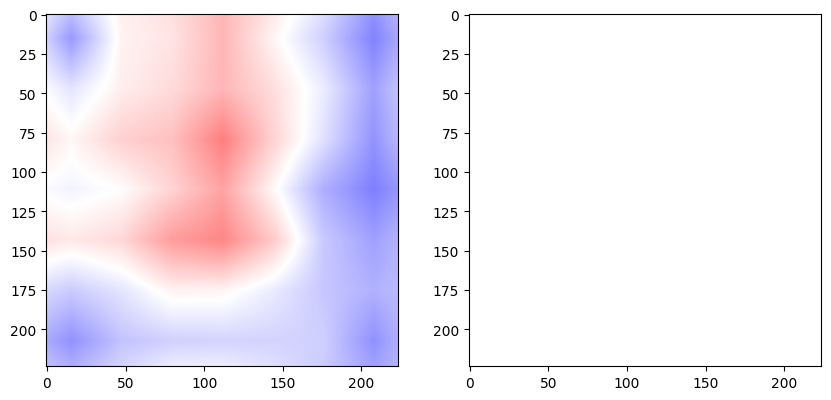

In [ ]:
gradcam(best_model,x , 224, 224, alpha=0.5)

In [ ]:
best_model2 = tf.keras.models.load_model(f'/content/gdrive/MyDrive/bestmodels/best_vgg_aug_model.h5')

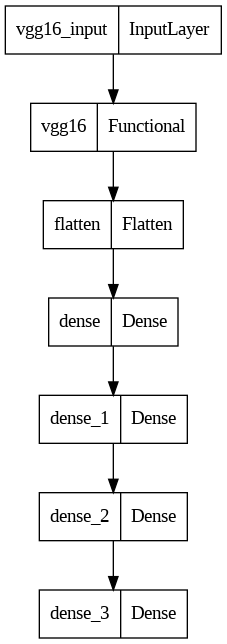

In [ ]:
plot_model(best_model2)

In [ ]:
def gradcam2(model, x, img_rows, img_cols, alpha=0.5, layer_name='block4_conv3'):
    '''
    Aplica técnica Gradient-weighted Class Activation Mapping (Grad-CAM) a
    una imagen, dado un modelo.
    Fuentes: https://fairyonice.github.io/Grad-CAM-with-keras-vis.html
    https://arxiv.org/abs/1610.02391

    Parametros:
      model (Sequential): modelo de Keras con al menos una capa convolucional.
      x (np.array): Array de numpy que representa la imagen a visualizar, con tamaño del model.input
      img_cols (int): cantidad de pixeles de ancho de la imagen
      img_cols (int): cantidad de pixeles de largo de la imagen
      alpha (float): transparencia del mapa de calor
      layer_name (string): capa de model a visualizar. Se recomienda que sea la última capa convolucional de model
    '''

    X = np.expand_dims(x, axis=0)

    # Realizar prediccion
    model.predict(X)

    last_conv=model.get_layer('vgg16')#.get_layer(layer_name)
    grads = K.gradients(model.output,last_conv.get_output_at(-1))[0]

    # Calculate gradients
    pooled_grads = K.mean(grads,axis=(0,1,2))
    iterate = K.function([model.input],[pooled_grads,last_conv.get_output_at(-1)[0]])
    pooled_grads_value,conv_layer_output = iterate([X])

    # Ponderar gradientes con activación de la capa visualizar.
    if np.any(pooled_grads_value!=0):
      for i in range(last_conv.input_shape[-1]):
        conv_layer_output[:,:,i] *= pooled_grads_value[i]

    heatmap = np.mean(conv_layer_output,axis=-1)

    # Activación Relu de los gradientes
    for i in range(heatmap.shape[0]):
      for j in range(heatmap.shape[1]):
          heatmap[i,j] = np.max(heatmap[i,j],0)

    # Escalado para visualización del heatmap
    heatmap = np.maximum(heatmap,0)
    if np.max(heatmap != 0):
      heatmap /= np.max(heatmap)

    # Graficado
    upsample = resize(heatmap, (img_rows,img_cols),preserve_range=True)

    f = plt.figure(figsize=(10,10))
    f.add_subplot(1,2, 1)
    plt.imshow(x)
    plt.imshow(upsample,alpha=alpha,cmap = 'bwr')
    f.add_subplot(1,2, 2)
    plt.imshow(x)
    plt.show(block=True)

    # print('Probabilidad de clase 1: ', model.predict_proba(X)[0], '\n')
    return

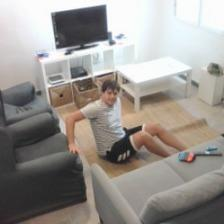

In [ ]:
img_path = '/content/fall-detection-bb-5/train/fall/denis2_10_jpg.rf.1c437dbb912c7d8bbd61be9d38d750b0.jpg'
img = image.load_img(img_path,color_mode='rgb', target_size=(640, 640))
imageb = cv2.imread(img_path)
x = image.img_to_array(img)
cv2_imshow(imageb)

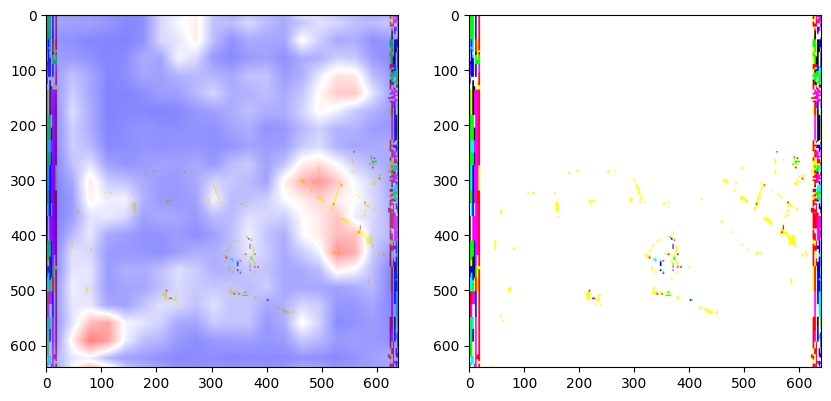

In [ ]:
gradcam2(best_model2 , x , 640, 640, alpha=0.5)

224 vgg

In [ ]:
best_model3 = tf.keras.models.load_model(f'/content/gdrive/MyDrive/bestmodels/vgg16_224_aug.h5')

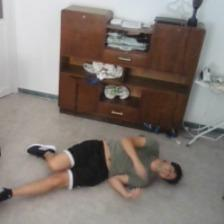

In [ ]:
img_path = '/content/fall-detection-bb-5/valid/fall/valdenis_26_jpg.rf.c863b82c22b71991b4316fc1e6a3321f.jpg'
img = image.load_img(img_path,color_mode='rgb', target_size=(224, 224))
imageb = cv2.imread(img_path)
x = image.img_to_array(img)
cv2_imshow(imageb)

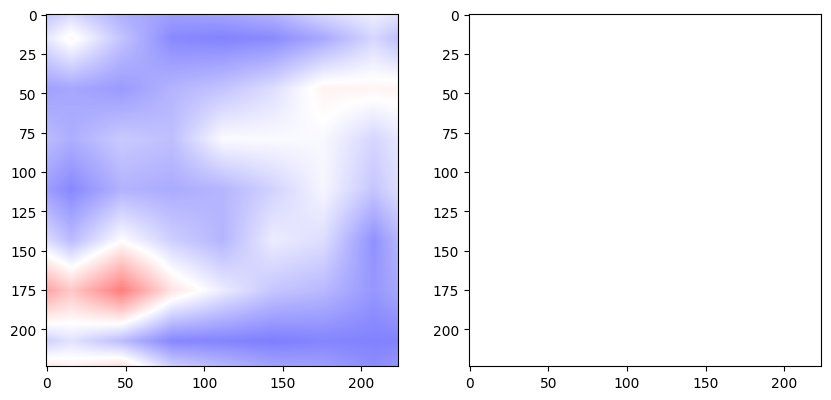

In [ ]:
gradcam2(best_model3, x , 224, 224, alpha=0.5)